In [2]:
import pandas as pd
import numpy as np
from pathlib import Path
import plotly.express as px
from PIL import Image
import os

In [3]:
df = pd.DataFrame(Path.cwd().joinpath("country-flags-4x3-png").glob("*.png"),columns=["filename"])
df.head()

,filename
0,C:\Users\asus\Documents\GitHub\data_vis\data\r...
1,C:\Users\asus\Documents\GitHub\data_vis\data\r...
2,C:\Users\asus\Documents\GitHub\data_vis\data\r...
3,C:\Users\asus\Documents\GitHub\data_vis\data\r...
4,C:\Users\asus\Documents\GitHub\data_vis\data\r...


In [5]:
df["country_code"] = df["filename"].apply(lambda d: d.stem.upper())
df.head()

,filename,country_code
0,C:\Users\asus\Documents\GitHub\data_vis\data\r...,AB
1,C:\Users\asus\Documents\GitHub\data_vis\data\r...,AD
2,C:\Users\asus\Documents\GitHub\data_vis\data\r...,AE
3,C:\Users\asus\Documents\GitHub\data_vis\data\r...,AF
4,C:\Users\asus\Documents\GitHub\data_vis\data\r...,AG


In [49]:
df["passResult"] = np.random.uniform(0, 1, len(df))
df.head()

,filename,country_code,passResult
0,C:\Users\asus\Documents\GitHub\data_vis\data\r...,ab,0.301274
1,C:\Users\asus\Documents\GitHub\data_vis\data\r...,ad,0.227337
2,C:\Users\asus\Documents\GitHub\data_vis\data\r...,ae,0.080278
3,C:\Users\asus\Documents\GitHub\data_vis\data\r...,af,0.398849
4,C:\Users\asus\Documents\GitHub\data_vis\data\r...,ag,0.492961


In [50]:
df = df.sort_values("country_code")
df.head()

,filename,country_code,passResult
0,C:\Users\asus\Documents\GitHub\data_vis\data\r...,ab,0.301274
1,C:\Users\asus\Documents\GitHub\data_vis\data\r...,ad,0.227337
2,C:\Users\asus\Documents\GitHub\data_vis\data\r...,ae,0.080278
3,C:\Users\asus\Documents\GitHub\data_vis\data\r...,af,0.398849
4,C:\Users\asus\Documents\GitHub\data_vis\data\r...,ag,0.492961


In [51]:
fig = px.scatter(df, x="country_code", y="passResult").add_traces(
    px.scatter(df, "country_code", np.full(len(df), -0.05))
    .update_traces(marker_color="rgba(0,0,0,0)", hovertemplate="%{x}")
    .data
)

In [52]:
for x in fig.data[0].x:
    fig.add_layout_image(
        source=Image.open(df.loc[df["country_code"].eq(x), "filename"].values[0]),
        x=x,
        y=-0.01,
        xref="x",
        yref="y",
        xanchor="center",
        sizex=1,
        sizey=1,
    )
    



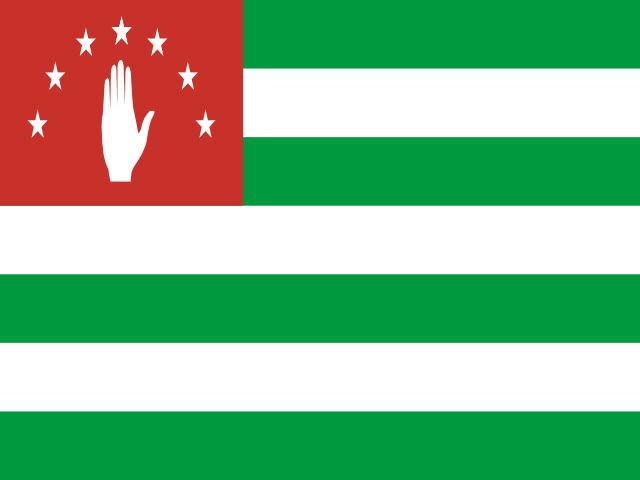
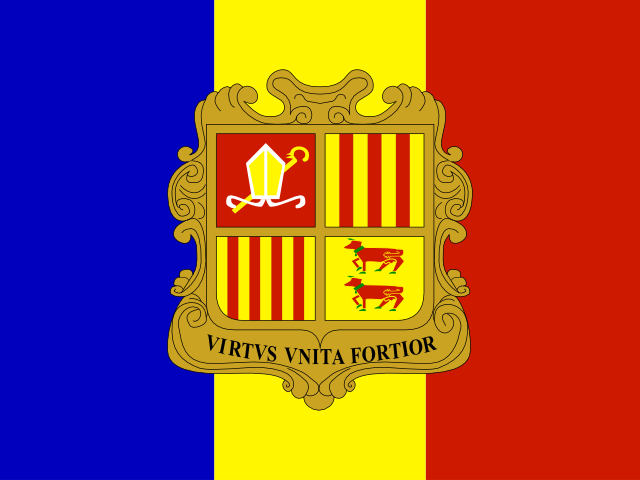
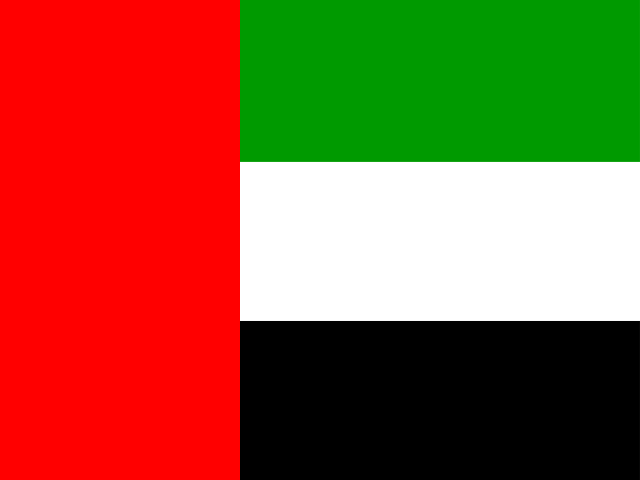
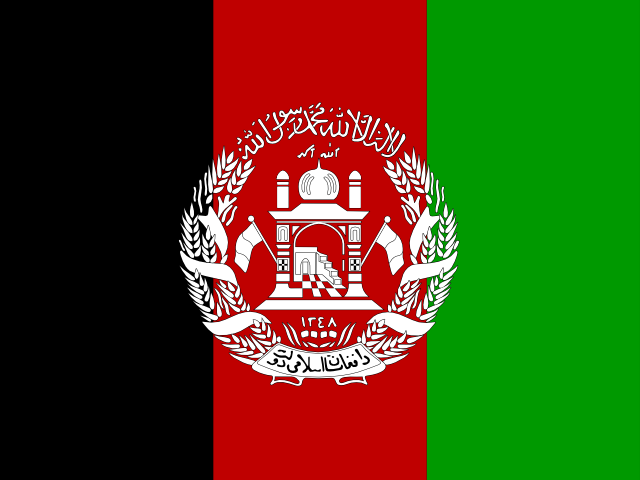
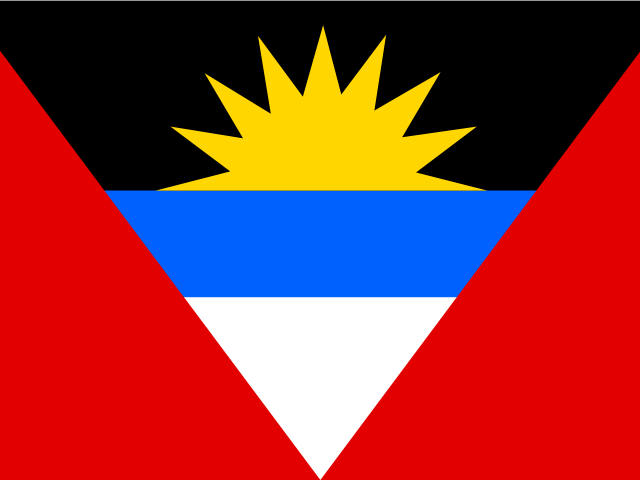
...
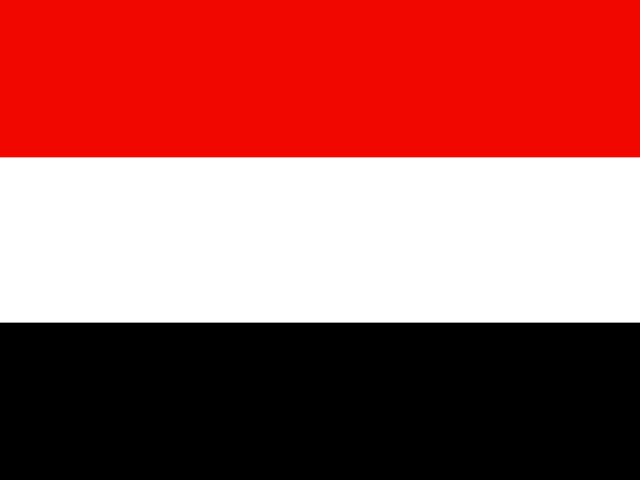
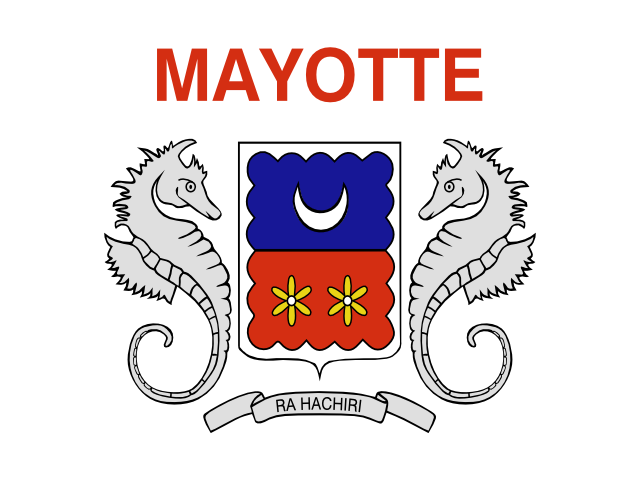
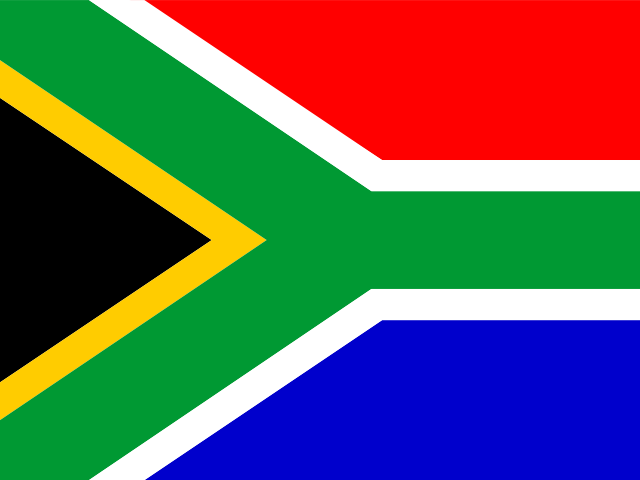
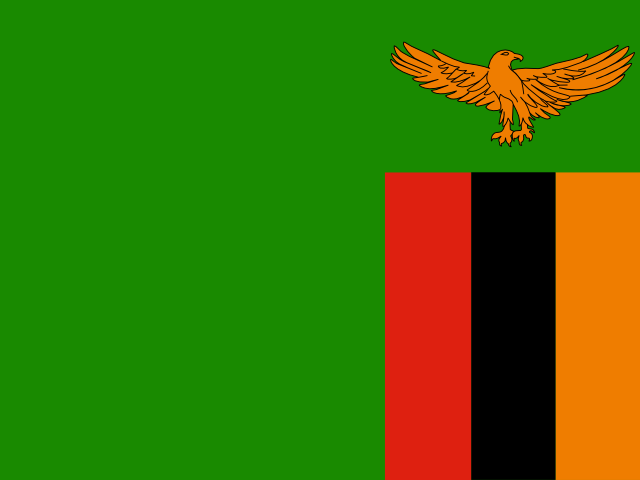
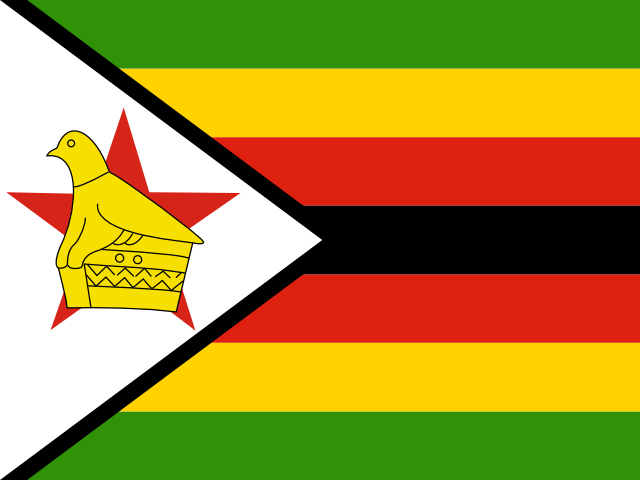

In [53]:
fig.update_layout(xaxis={"visible":False})